# Compound Events
- https://github.com/e-baumer/standard_precip

### Metrics
|suffix|definition|note|
|--|--|--|
|day_total|Total Compound Days|a day that satisfies all conditions|
|event_total|Total Compound Event|a compound day that is part of a sequence of 1+ consecutive days|
|sequence_total|Total Compound Sequence|a sequence of consecutive compound events with size>1|
|duration_mean|Average Compound Sequence Duration|a sequence of consecutive compound events with size>1|
|duration_max|Max Compound Sequence Duration|a sequence of consecutive compound events with size>1|

### Compound Dry Hot Event (CDHE), Compound Wet Hot Event (CWHE)
- Variables: spi, temperature
- Base Years: 1981-2020
- SSP Years: 2021-2100

### Compound Flooding Event (CFE)
- Variables: rzsm, accumulated precipitation
- Base Years: 1950-2014
- SSP Years: 2015-2099 (rzsm only hase 1/1 for 2100)
- RZSM ONLY HAS HISTORICAL AND SSP245

In [1]:
# !python rzsm.py -i '../CASI2_RZSM_RAW' -o '../compound'

In [2]:
%%time
import os
import pandas as pd
import warnings
from plot import Plot
from process import Compound
warnings.filterwarnings('ignore')

plotly = False
event = ['CWHE','CDHE', 'CFE'][2]
# months = [6, 7, 8]
months = None
center='LARC'

freq, scale = 'D', 7 # pr accumulation period
gamma_n=7
metrics = {
    '_duration_mean':  f'Average {event} Duration',
    '_sequence_total': f'Total {event} Sequences',
    '_duration_max':   f'Max {event} Duration',
    '_event_total':    f'Total {event}',
    '_day_total':      f'Total {event} Days'
}

def f_to_c(f):
    return (f - 32) * 5/9
    
def get_thresholds(event):
    ''' Set up thresholds for different severity levels of compound events.
        return (dict of thresholds, whether to create all threshold combos)
    '''
    if event == 'CDHE':
        return ({'spi': ['<', [-1, -2]], # standardized
                 'tasmax': ['>', [f_to_c(90)]], # tm (f->c)
                }, True)
    elif event == 'CWHE':
        return ({'spi': ['>', [-1, -2]], # standardized
                 'tasmax': ['>', [f_to_c(90)]], # tm (f->c)
                }, True)
    elif event == 'CFE':
        # return ({'rzsm': ['>', [.7, .8, .9, .95, .98]], # percentiles
        #          'pr': ['>', [100, 125, 150]], # mm/day
        #         }, True)
        return ({'rzsm': ['>', [.7, .8, .9, .95, .98]], # percentiles
                 'pr': ['>', [50, 80]], # mm/day
                }, True)
        # return ({'rzsm': ['>', [.7]], # percentiles
        #          'pr': ['>', [50, 80]], # mm/day
        #         }, True)
    else:
        raise ValueError('Invalid event type')
        
thresholds = get_thresholds(event)
result, metric_aggs, var_aggs, dfs = Compound(center, event, months, freq, scale, thresholds, gamma_n).main()

{'rzsm': ('>', 0.7), 'pr': ('>', 50)}
{'rzsm': ('>', 0.7), 'pr': ('>', 80)}
{'rzsm': ('>', 0.8), 'pr': ('>', 50)}
{'rzsm': ('>', 0.8), 'pr': ('>', 80)}
{'rzsm': ('>', 0.9), 'pr': ('>', 50)}
{'rzsm': ('>', 0.9), 'pr': ('>', 80)}
{'rzsm': ('>', 0.95), 'pr': ('>', 50)}
{'rzsm': ('>', 0.95), 'pr': ('>', 80)}
{'rzsm': ('>', 0.98), 'pr': ('>', 50)}
{'rzsm': ('>', 0.98), 'pr': ('>', 80)}
CPU times: user 11 s, sys: 345 ms, total: 11.3 s
Wall time: 11.7 s


In [3]:
# (accummulated) precipitation: all ssp's for ssp years
if 'spi' not in dfs:
    dfs['daily'].filter(regex='_pr').describe(percentiles=[0.95, 0.995, 0.999, 0.9999]).T.round(2)

# Analysis
## Trends

In [4]:
# SPI
var = 'spi'
if var in dfs:
    p = Plot(center, months, f'Average SPI', f'_{var}')
    p.dist_sns(var_aggs)
    p.ts_plotly(var_aggs) if plotly else p.ts_sns(var_aggs)

In [5]:
# Max Temperature
var = 'tasmax'
if var in dfs:
    p = Plot(center, months, f'Average Max Temperature', f'_{var}')
    p.dist_sns(var_aggs)
    p.ts_plotly(var_aggs) if plotly else p.ts_sns(var_aggs)

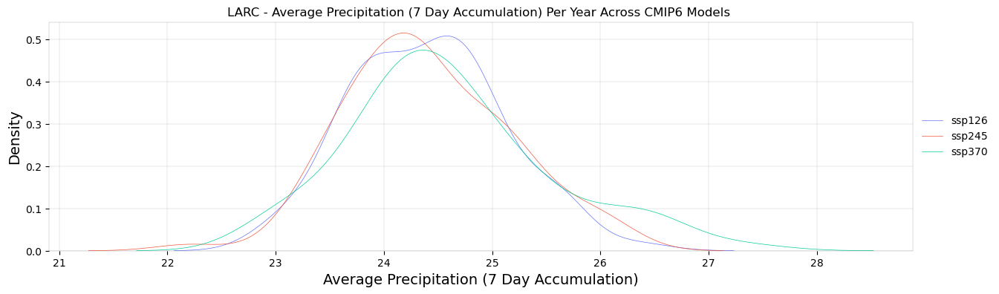

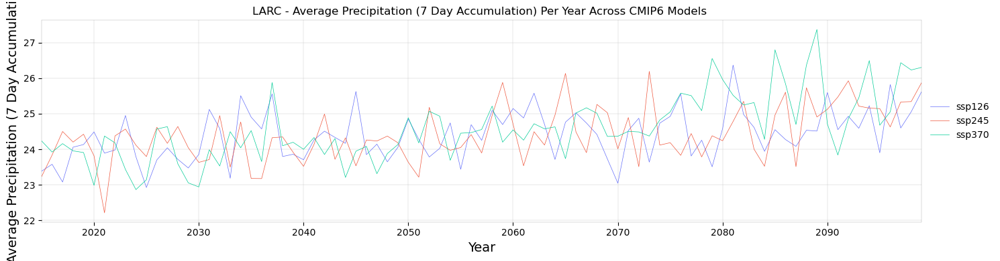

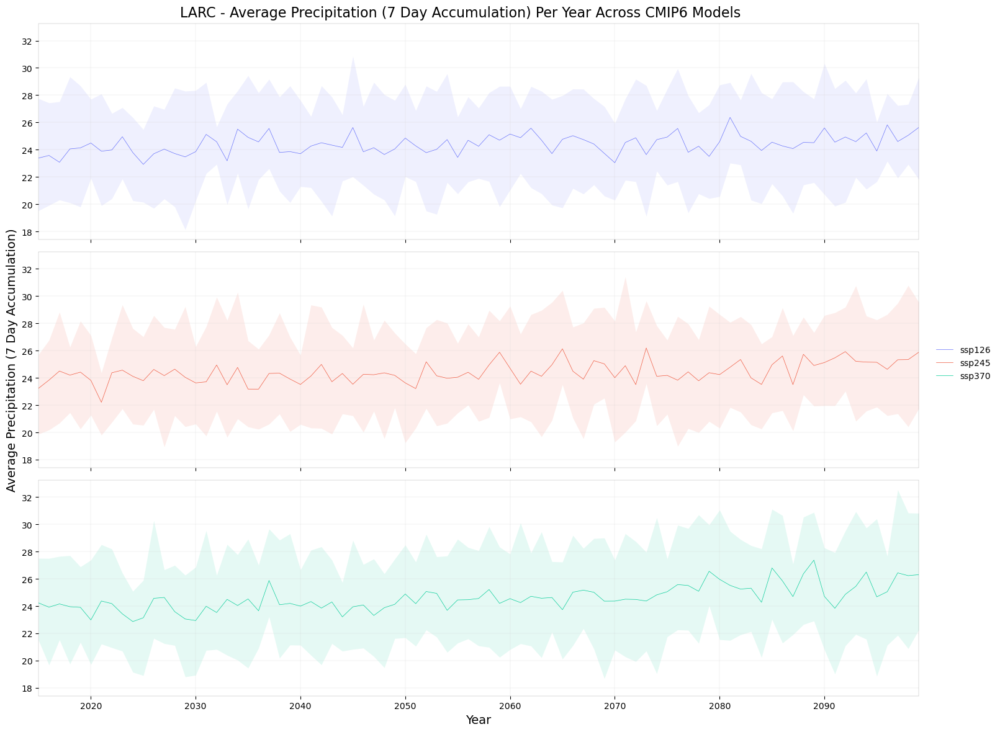

In [6]:
# Precipitation
var = 'pr'
if var in dfs:
    acc = f'({scale} Day Accumulation)'
    p = Plot(center, months, f"Average Precipitation {acc if event=='CFE' else ''}", f'_{var}')
    p.dist_sns(var_aggs)
    p.ts_plotly(var_aggs) if plotly else p.ts_sns(var_aggs)

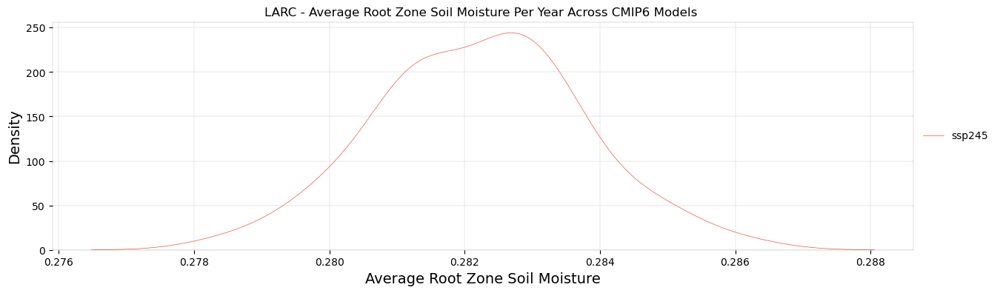

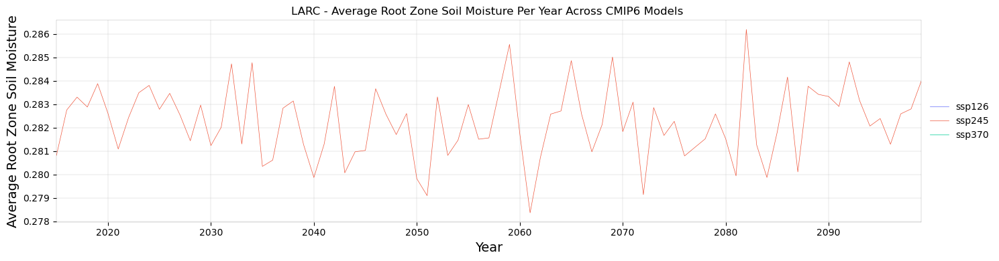

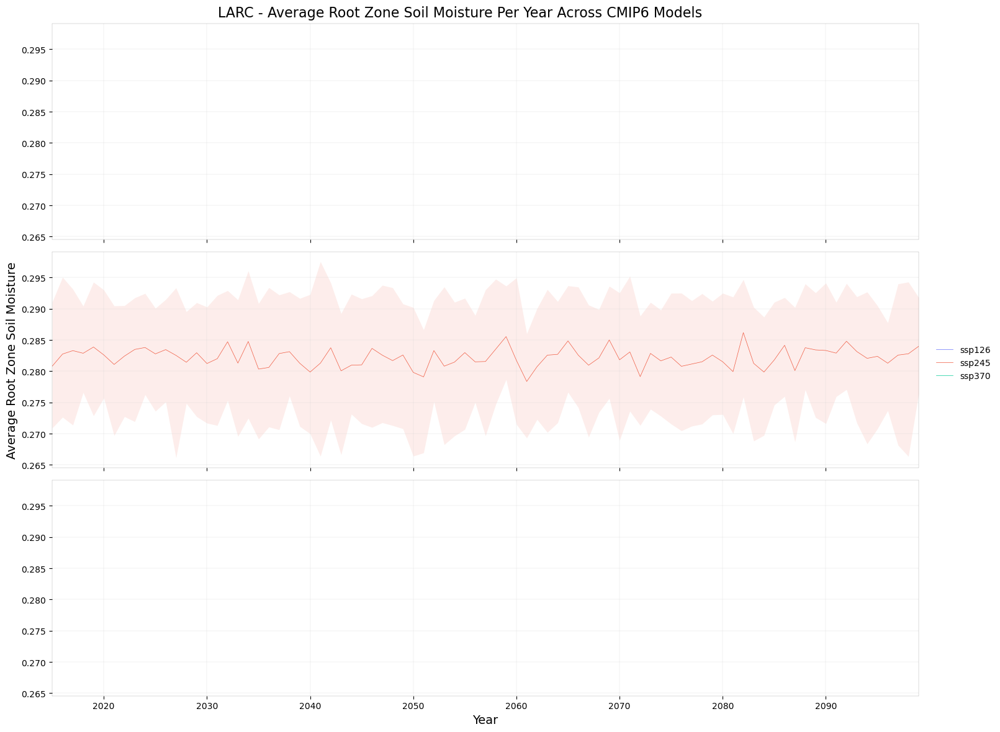

In [7]:
# Root Zone Soil Moisture
var = 'rzsm'
if var in dfs:
    p = Plot(center, months, f'Average Root Zone Soil Moisture', f'_{var}')
    p.dist_sns(var_aggs)
    p.ts_plotly(var_aggs) if plotly else p.ts_sns(var_aggs)

## Compound

In [8]:
display(metric_aggs)

,threshold,ssp,date,mean_day_total,med_day_total,p10_day_total,p90_day_total,mean_event_total,med_event_total,p10_event_total,...,p10_sequence_total,p90_sequence_total,mean_duration_max,med_duration_max,p10_duration_max,p90_duration_max,mean_duration_mean,med_duration_mean,p10_duration_mean,p90_duration_mean
0,rzsm>0.7_pr>50,ssp245,2015,33.10,33.10,11.9,44.3,32.00,32.00,11.9,...,3.0,9.1,9.30,9.30,4.9,12.2,4.8610,4.8610,3.513,6.130
1,rzsm>0.7_pr>50,ssp245,2016,36.15,36.15,11.8,57.0,35.05,35.05,10.9,...,2.9,9.1,10.95,10.95,5.9,12.3,5.6375,5.6375,3.770,6.033
2,rzsm>0.7_pr>50,ssp245,2017,33.80,33.80,9.5,53.3,32.45,32.45,9.4,...,2.0,10.1,11.00,11.00,2.9,12.2,5.6885,5.6885,2.450,7.397
3,rzsm>0.7_pr>50,ssp245,2018,29.20,29.20,10.8,42.7,28.20,28.20,9.9,...,2.9,9.0,8.30,8.30,5.0,8.2,5.1840,5.1840,3.450,6.786
4,rzsm>0.7_pr>50,ssp245,2019,34.25,34.25,7.8,67.1,32.95,32.95,6.7,...,2.0,10.1,8.30,8.30,3.8,12.5,4.8185,4.8185,3.350,6.176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
845,rzsm>0.98_pr>80,ssp245,2095,5.50,5.50,0.0,11.6,5.10,5.10,0.0,...,0.0,2.2,3.35,3.35,0.0,7.0,2.7625,2.7625,0.000,5.550
846,rzsm>0.98_pr>80,ssp245,2096,3.30,3.30,0.0,7.5,2.85,2.85,0.0,...,0.0,1.1,2.35,2.35,0.0,6.1,2.2500,2.2500,0.000,6.000
847,rzsm>0.98_pr>80,ssp245,2097,4.55,4.55,0.0,12.2,4.25,4.25,0.0,...,0.0,2.1,2.45,2.45,0.0,6.0,2.1065,2.1065,0.000,4.447
848,rzsm>0.98_pr>80,ssp245,2098,4.05,4.05,0.0,11.1,3.70,3.70,0.0,...,0.0,3.0,2.40,2.40,0.0,5.0,2.0625,2.0625,0.000,5.000


In [9]:
# # Total Compound Days
# m = '_day_total'
# Plot(center, months, metrics[m], m).all(metric_aggs, plotly)

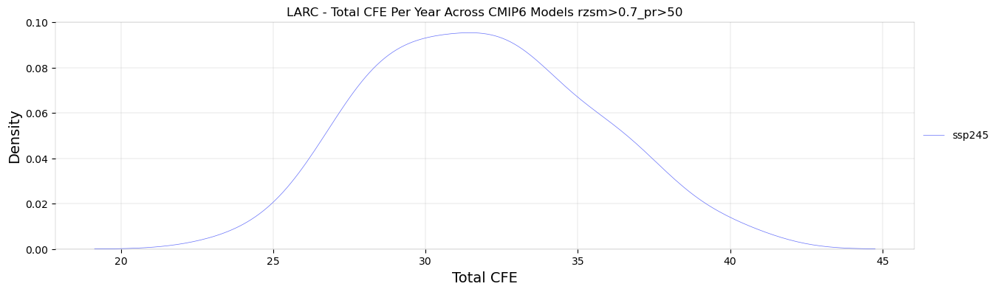

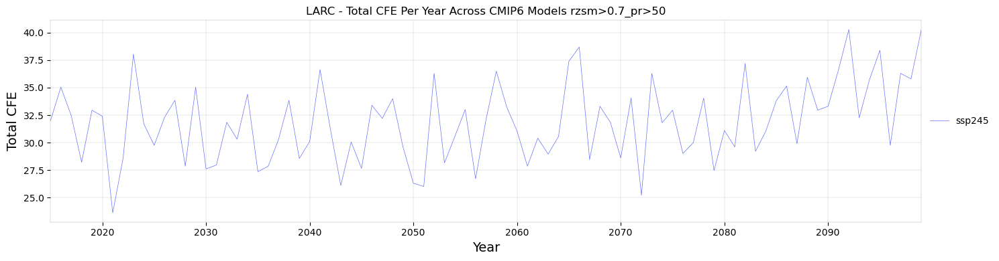

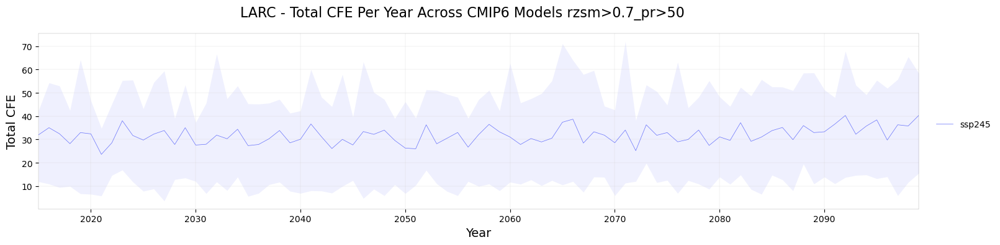

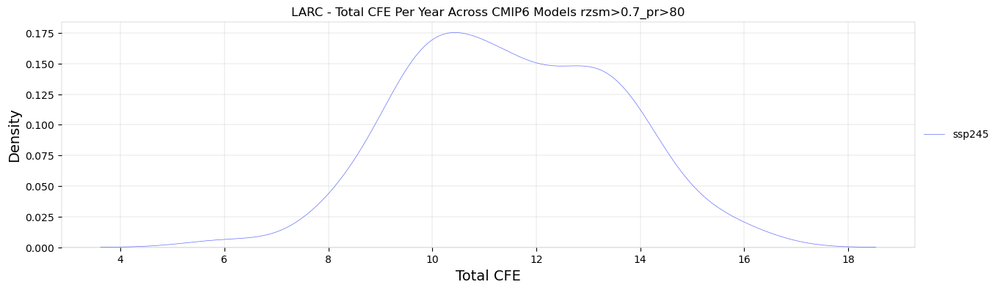

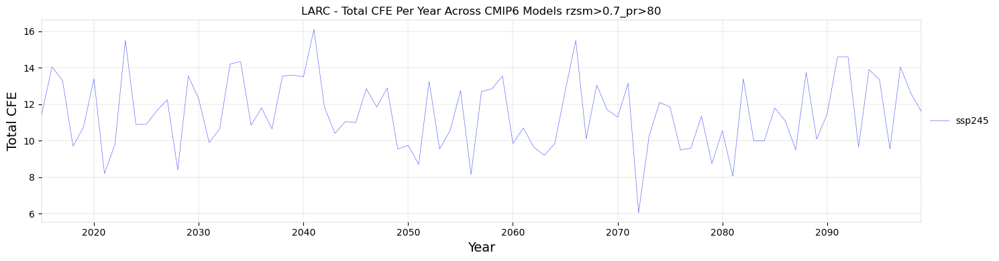

...

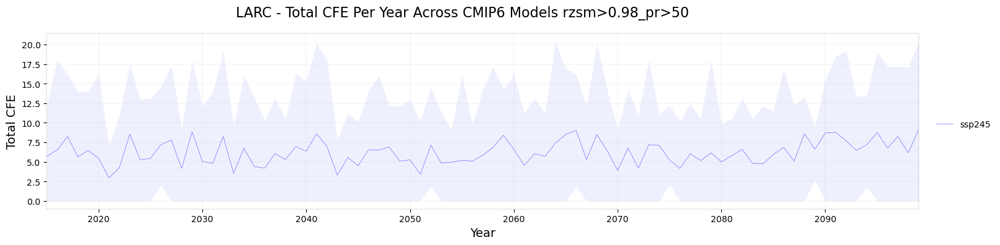

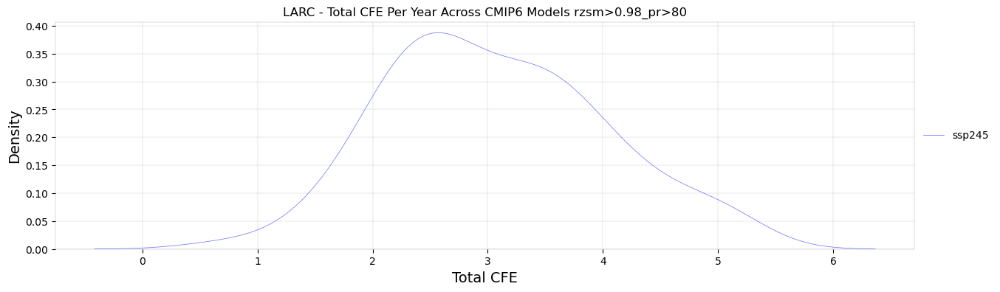

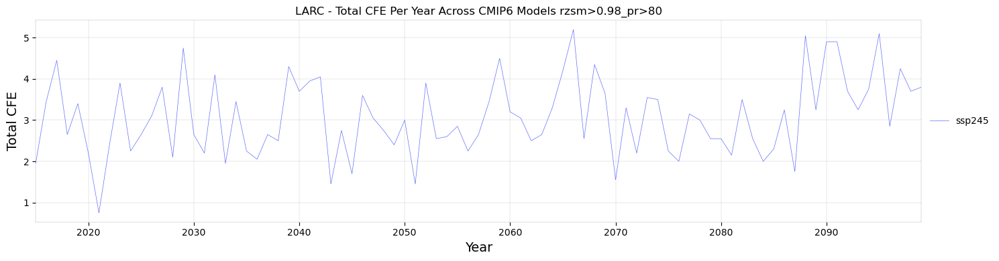

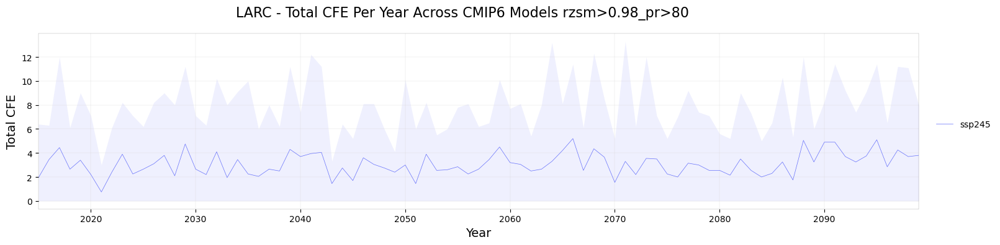

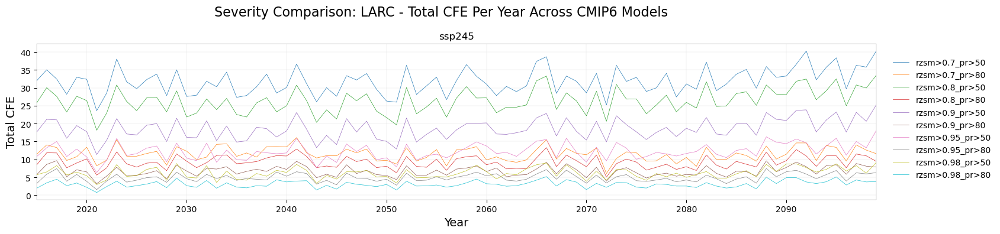

In [10]:
# Total Compound Events
m = '_event_total'
Plot(center, months, metrics[m], m).all(metric_aggs, plotly)

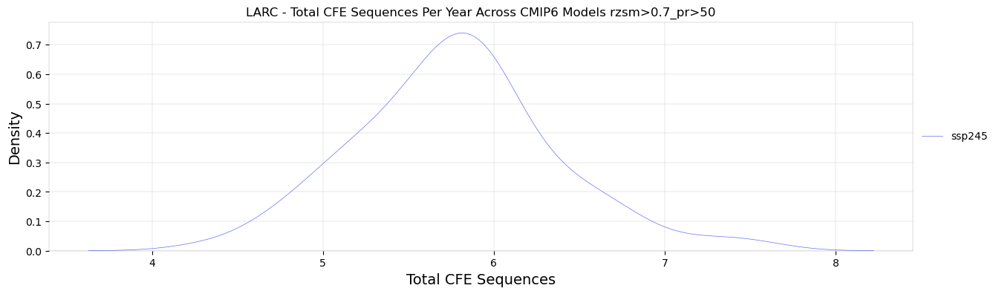

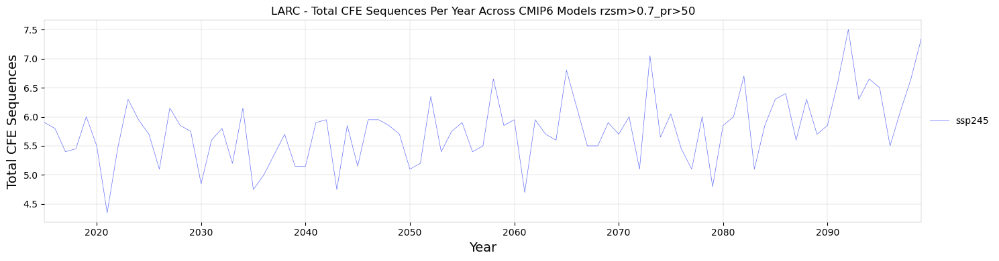

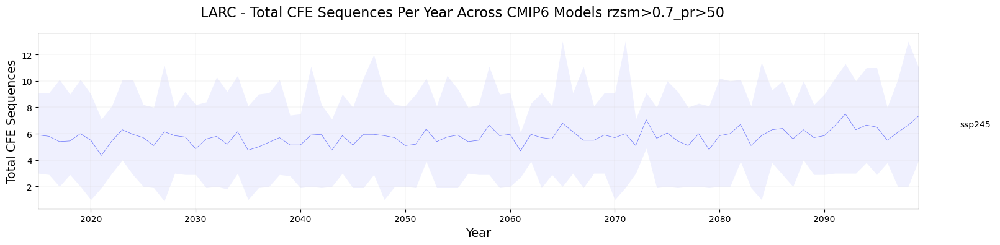

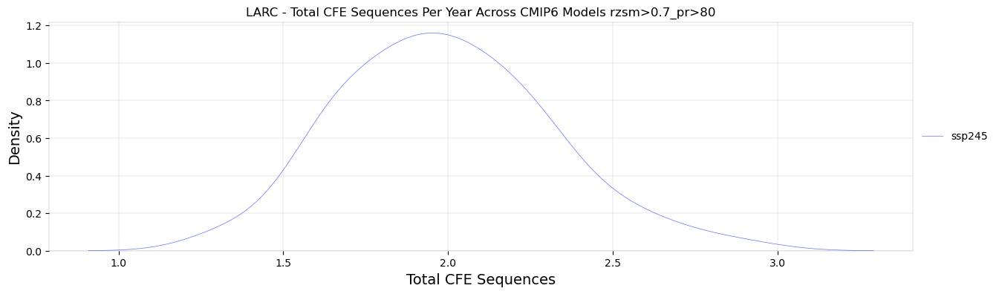

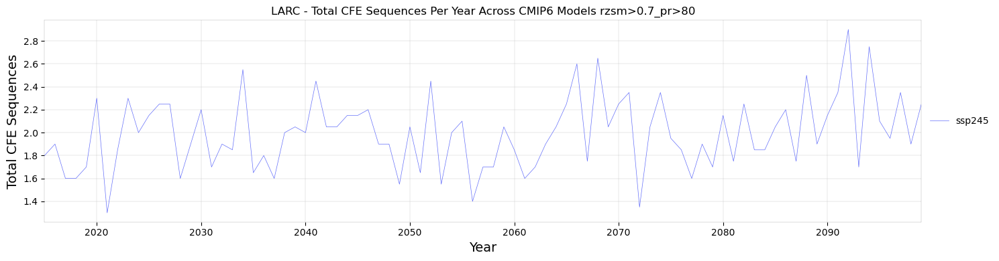

...

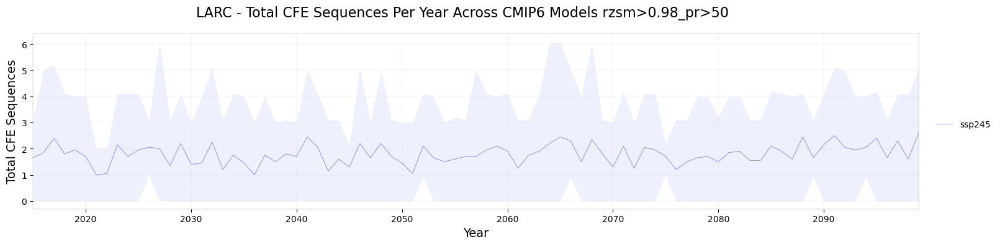

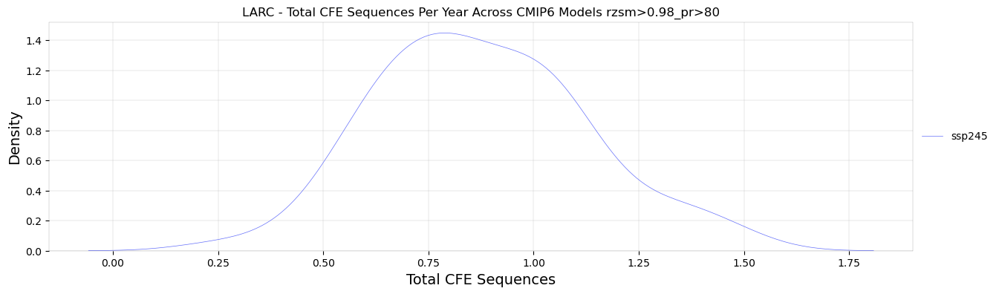

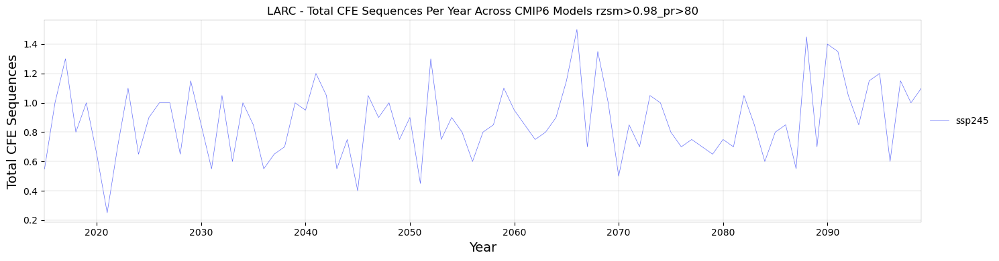

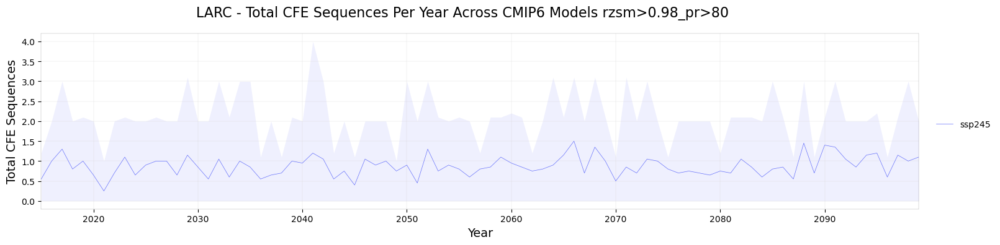

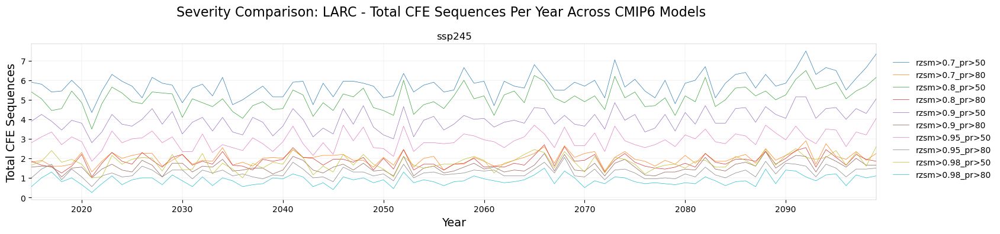

In [11]:
# Total Compound Event Sequences
m = '_sequence_total'
Plot(center, months, metrics[m], m).all(metric_aggs, plotly)

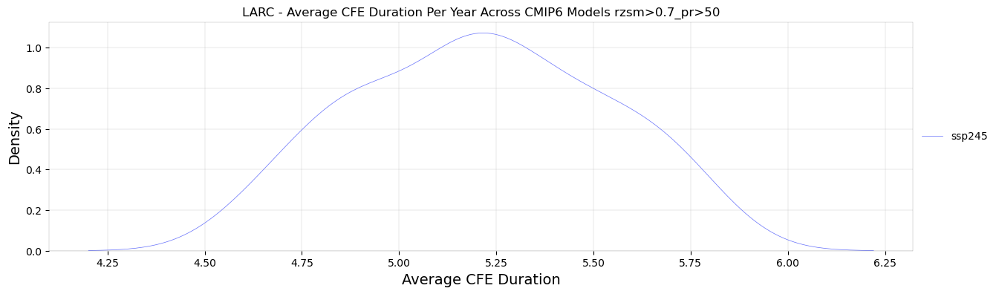

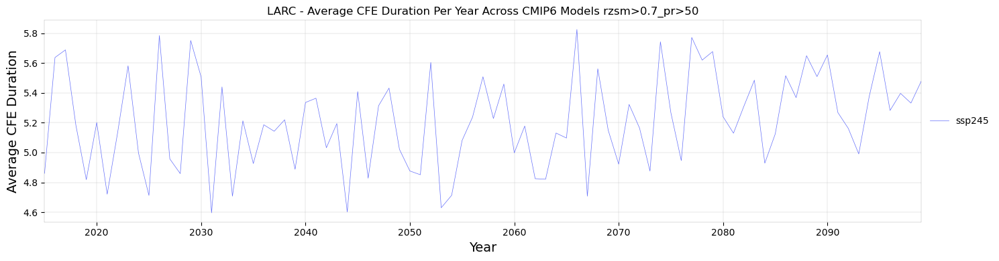

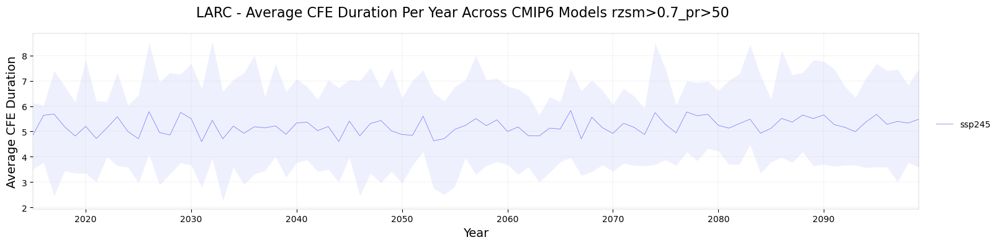

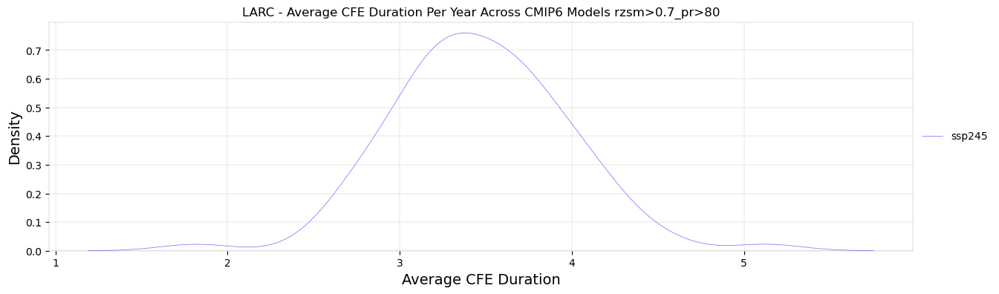

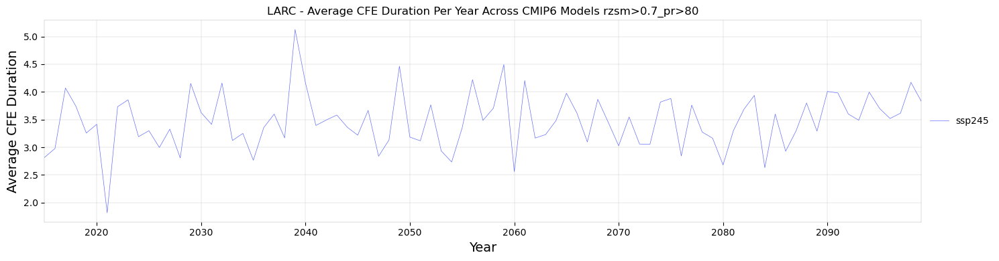

...

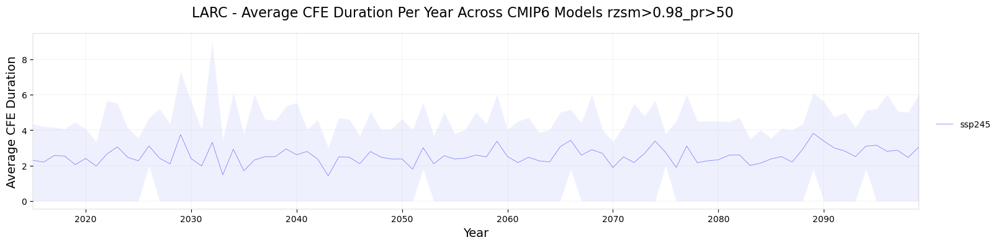

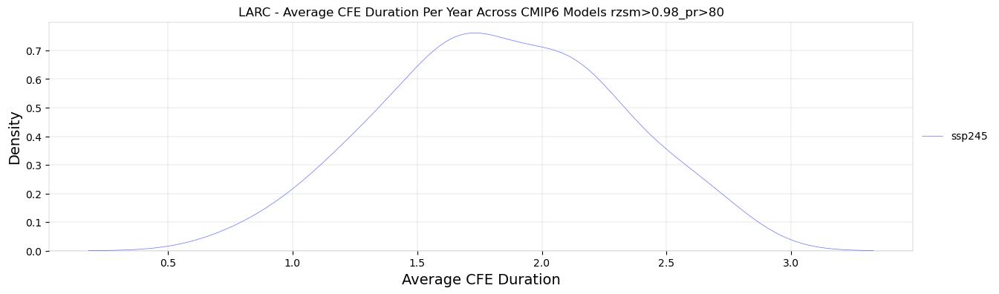

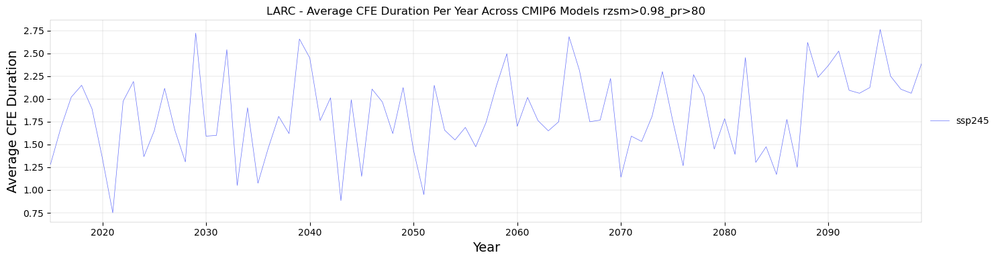

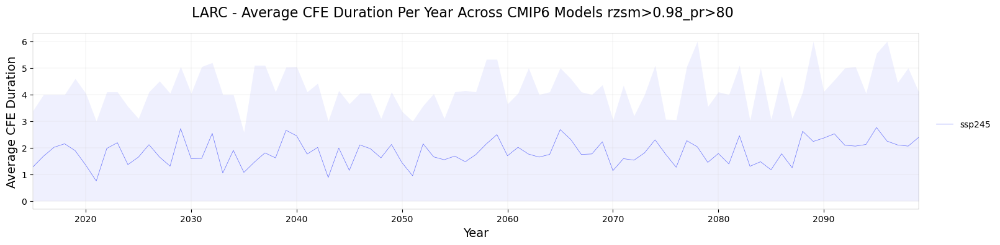

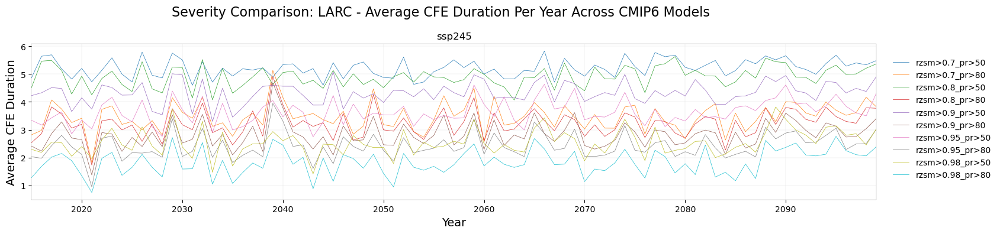

In [12]:
# Average Compound Event Sequence Duration
m = '_duration_mean'
Plot(center, months, metrics[m], m).all(metric_aggs, plotly)

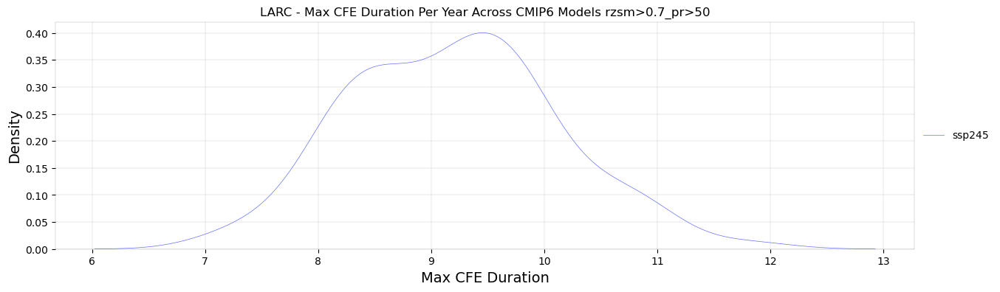

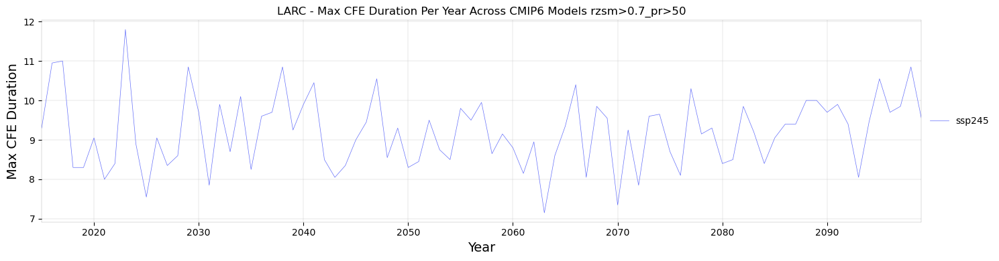

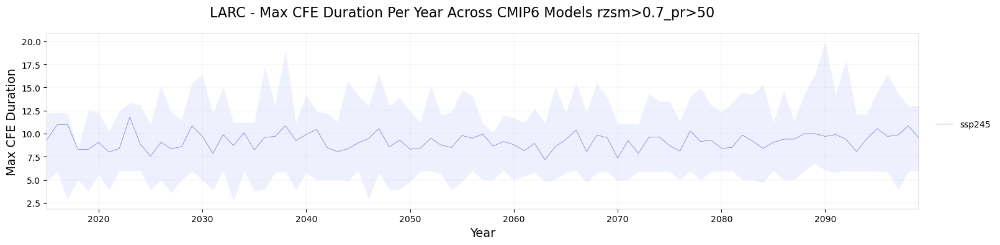

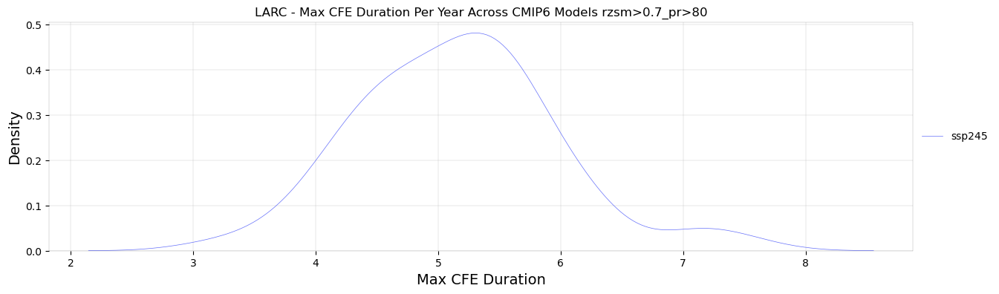

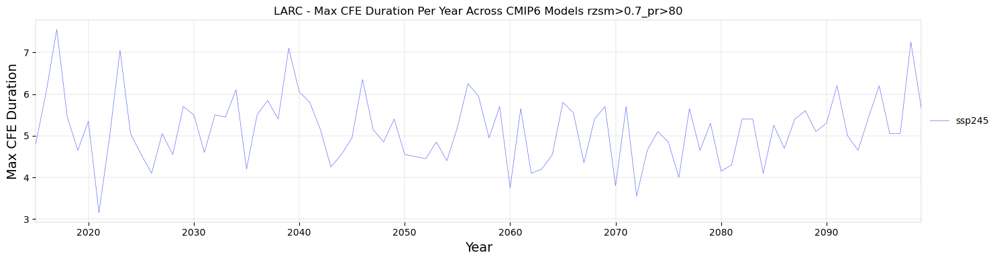

...

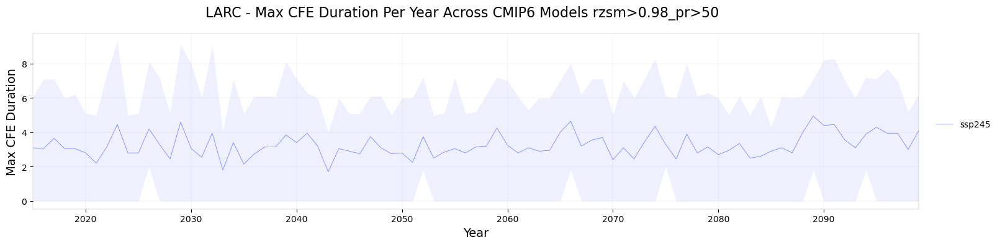

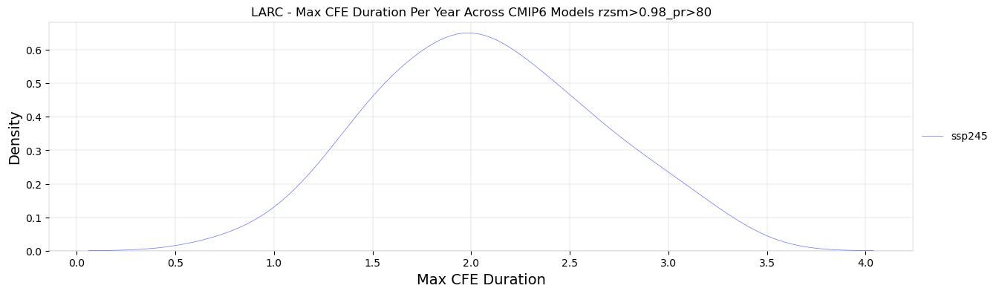

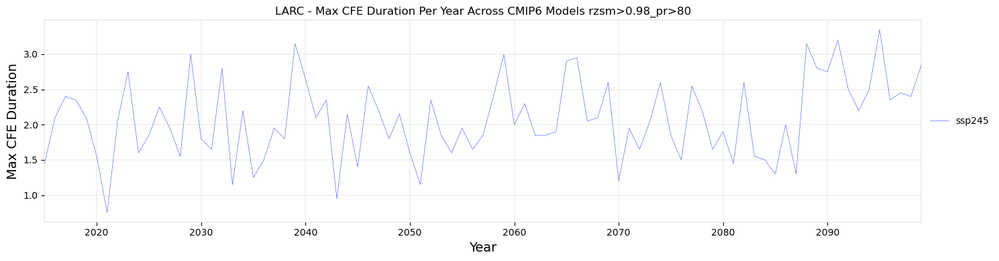

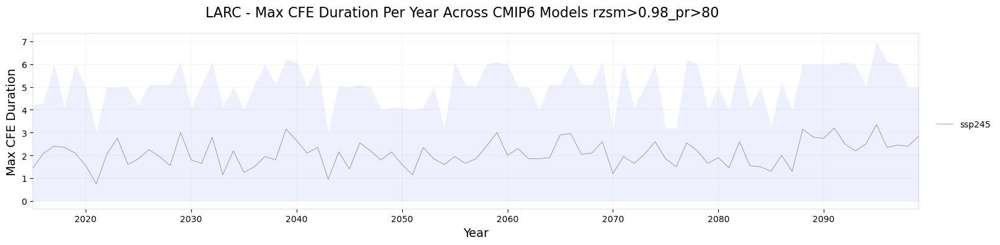

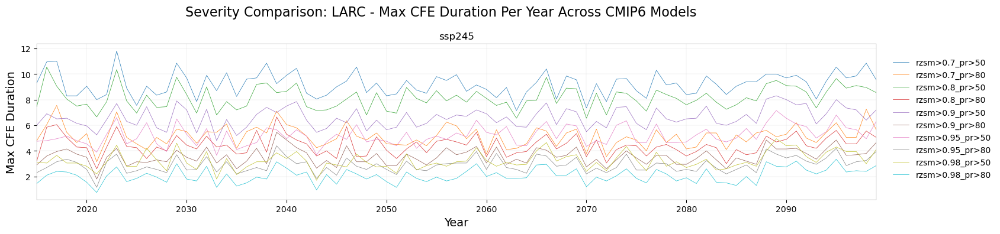

In [13]:
# Max Compound Event Sequence Duration
m = '_duration_max'
Plot(center, months, metrics[m], m).all(metric_aggs, plotly)

## Compound Event Comparison: Total Sequences vs Average Duration vs Max Duration

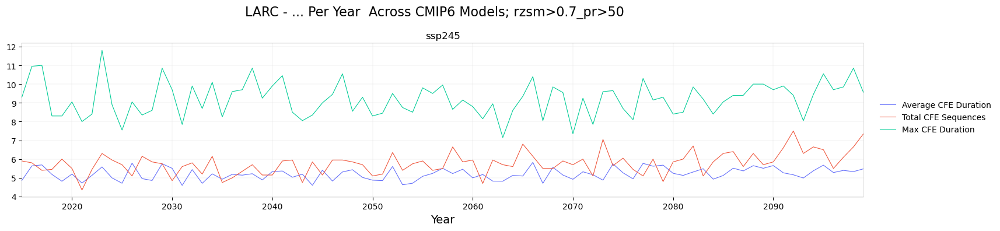

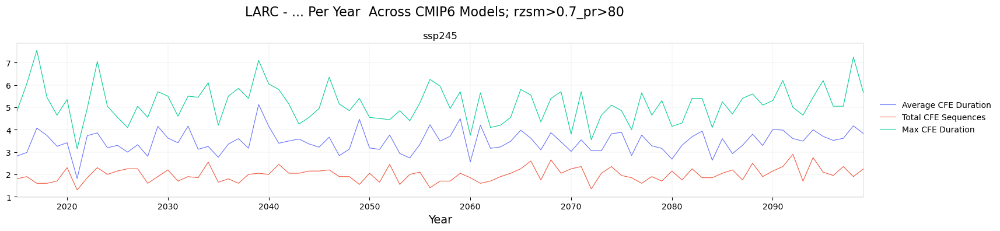

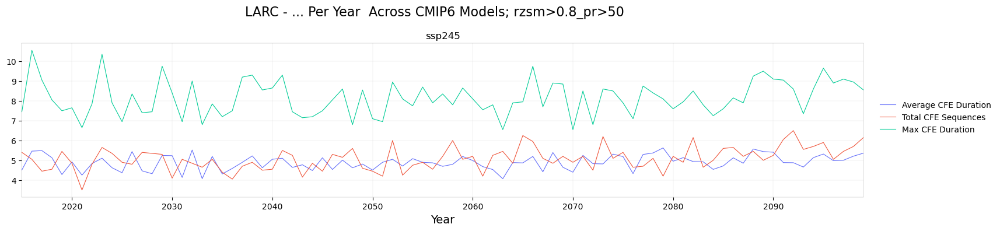

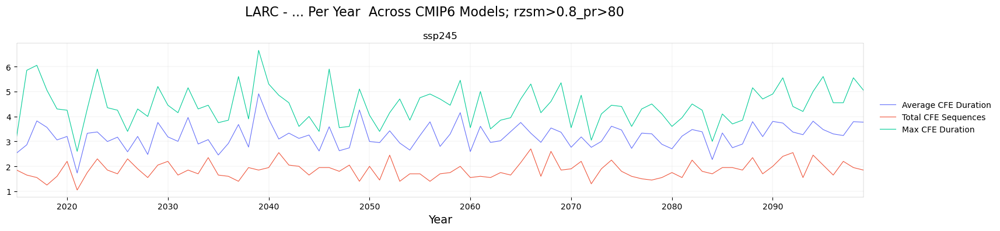

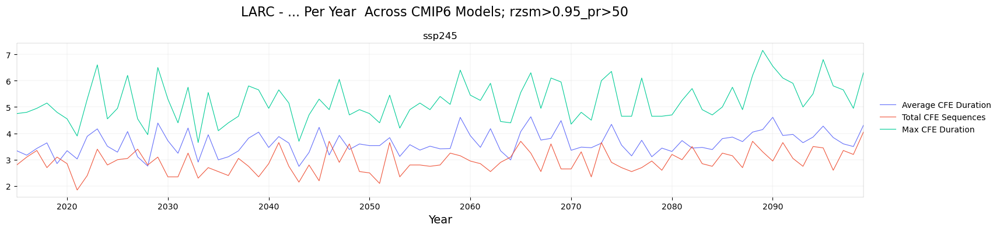

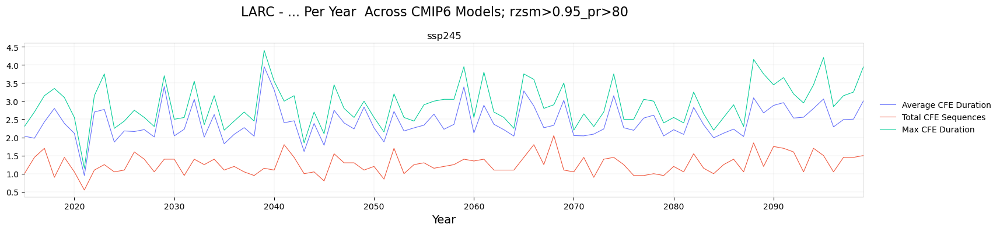

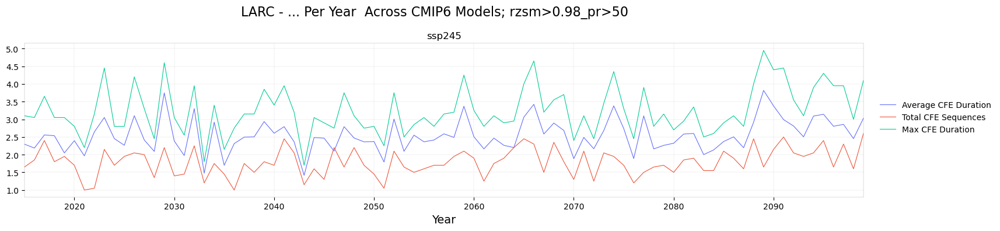

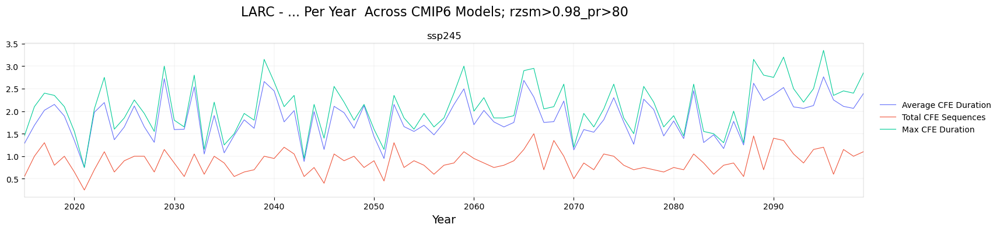

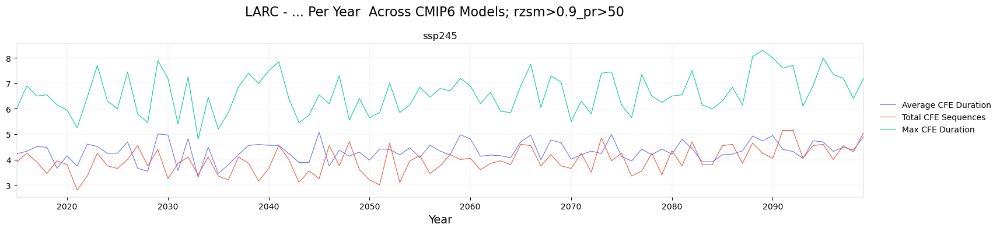

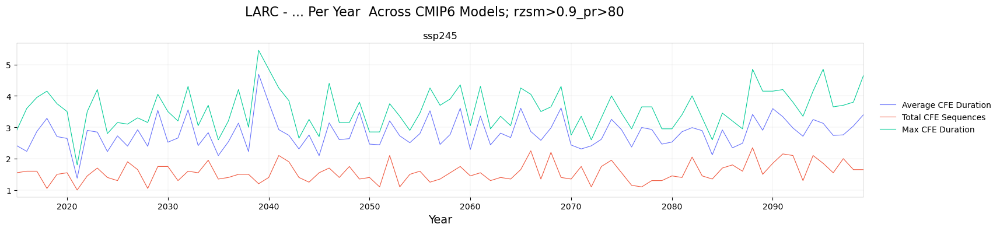

In [14]:
var = ['_duration_mean', '_sequence_total', '_duration_max']            
Plot(center, months, '', '').variable_comp(metric_aggs, var, metrics)

## SPI Time Scale Comparison

In [15]:
%%time
%%capture

def process_scale(s, threshold):
    print(s)
    _, metric_aggs_, _, _ = Compound(center, event, months, freq, s, threshold, gamma_n).main()
    metric_aggs_.insert(0, 'scale', s)
    return metric_aggs_.drop(columns='threshold')

if event in ['CWHE','CDHE']:
    scales = [7, 14, 30, 60, 90][:2] # days
    threshold = ({'spi': ['<', [-1]], # standardized
                  'tasmax': ['>', [f_to_c(90)]], # tm (f->c)
                 }, False)
    metric_aggs_ = [process_scale(s, threshold) for s in scales]
    metric_aggs_ = pd.concat(metric_aggs_, ignore_index=True)

CPU times: user 1.01 ms, sys: 35 μs, total: 1.05 ms
Wall time: 1.06 ms


In [16]:
if event in ['CWHE','CDHE']:
    Plot(center, months, '', '').scale_comp(metric_aggs_, metrics)